In [ ]:
!pip install mtcnn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 35.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 71.5 MB/s eta 0:00:00


In [ ]:
import cv2
import os
import numpy as np
from google.colab.patches import cv2_imshow
import time
import dlib
import os
from mtcnn.mtcnn import MTCNN


In [ ]:

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#val_bbox_path = f"{rootpath}/WFD/wider_face_split/wider_face_split/wider_face_val_bbx_gt.txt"
#val_images = f"{rootpath}/WFD/wider_val/WIDER_val/images/"

faces_path = '/content/drive/MyDrive/imagenes_faces/face_detection/faces/'

NFACES = 69 # faces counted on all images

metrics = {modelname:{"p":None, "t":None} for modelname in ["HAAR", "MTCNN", "DLIB", "DNN"]}
ImageExtensions = ('.jpg', '.jpeg', '.png', '.bmp')
images = [imf for imf in os.listdir(faces_path) if imf.endswith(ImageExtensions)]
print(f'Imágenes a analizar: {images}')

Imágenes a analizar: ['images (13).jpg', 'images (10).jpg', 'download (1).jpg', 'images (2).jpg', 'images.jpg', 'images (12).jpg', 'images (3).jpg', 'images (7).jpg', 'images (8).jpg', 'images (11).jpg', 'images (9).jpg', 'images (6).jpg', 'image (14).jpg', 'image (15).jpg', 'images (16).jpg', 'images (17).jpg']


-------------------------------------------------------
Rostros detectados en images (13).jpg: 2


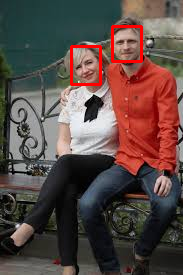

-------------------------------------------------------
Rostros detectados en images (10).jpg: 3


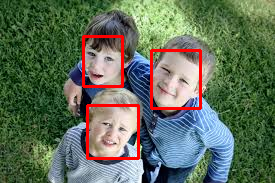

-------------------------------------------------------
Rostros detectados en download (1).jpg: 3


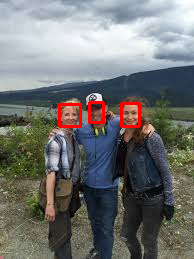

-------------------------------------------------------
Rostros detectados en images (2).jpg: 1


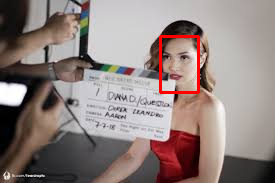

-------------------------------------------------------
Rostros detectados en images.jpg: 1


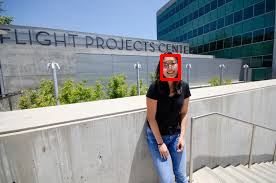

-------------------------------------------------------
Rostros detectados en images (12).jpg: 3


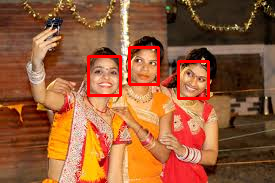

-------------------------------------------------------
Rostros detectados en images (3).jpg: 2


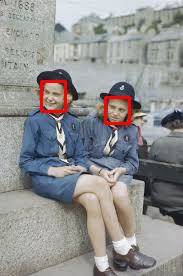

-------------------------------------------------------
Rostros detectados en images (7).jpg: 1


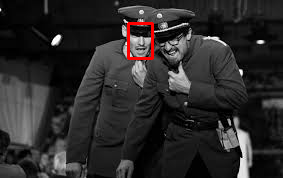

-------------------------------------------------------
Rostros detectados en images (8).jpg: 6


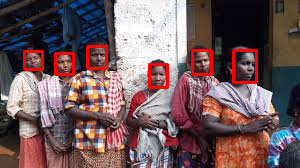

-------------------------------------------------------
Rostros detectados en images (11).jpg: 2


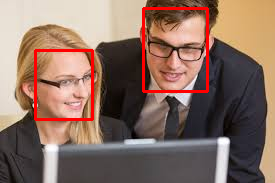

-------------------------------------------------------
Rostros detectados en images (9).jpg: 3


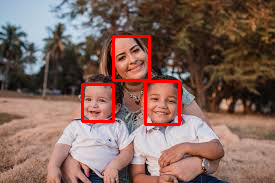

-------------------------------------------------------
Rostros detectados en images (6).jpg: 1


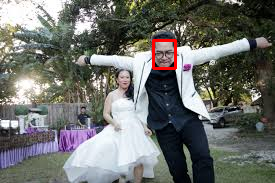

-------------------------------------------------------
Rostros detectados en image (14).jpg: 4


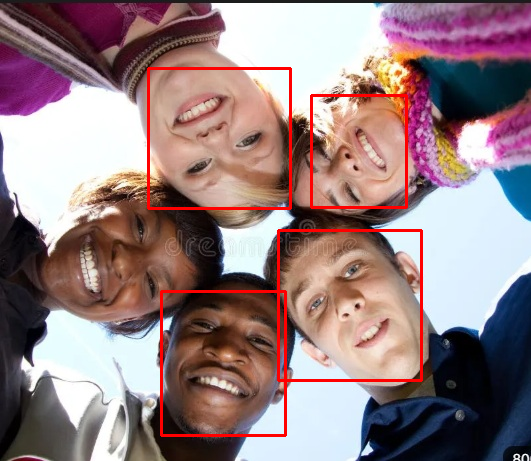

-------------------------------------------------------
Rostros detectados en image (15).jpg: 18


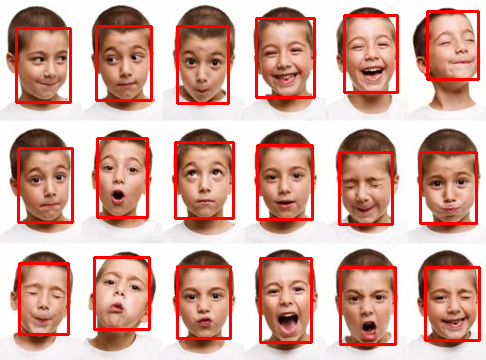

-------------------------------------------------------
Rostros detectados en images (16).jpg: 6


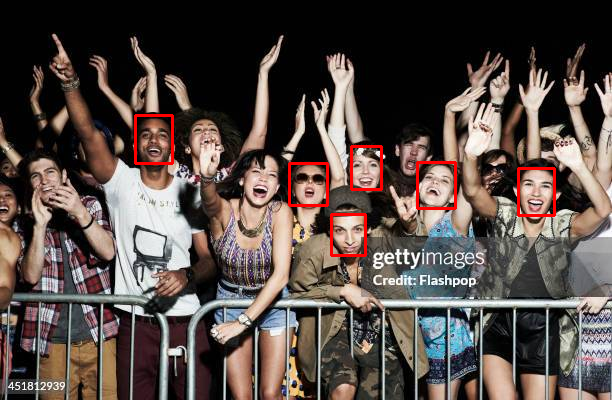

-------------------------------------------------------
Rostros detectados en images (17).jpg: 2


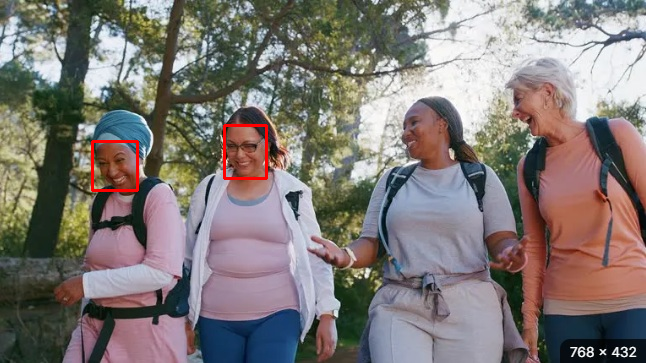

-------------------------------------------------------
Tiempo de ejecución: 2.1886401176452637
-------------------------------------------------------
-------------------------------------------------------
Tiempo de ejecución promedio: 2.189 segundos
-------------------------------------------------------


In [ ]:

# ------------------------------------------------------------------------------------
# DNN model
modelFile = '/content/drive/MyDrive/imagenes_faces/face_detection/models/res10_300x300_ssd_iter_140000.caffemodel'
configFile = '/content/drive/MyDrive/imagenes_faces/face_detection/models/deploy.prototxt.txt'
mname = "DNN"
net = cv2.dnn.readNetFromCaffe(configFile, modelFile)
iteraciones = 1
time_window = []
ConfidenceThreshold = 0.5
for i in range(iteraciones):
  counts = 0 # count detected faces
  time_init = time.time()
  print('-------------------------------------------------------')
  for image in images:
    img = cv2.imread(f'{faces_path}/{image}')
    if img is None:
      print('No se pude cargar la imágen')
      continue
    ## OBTENIENDO DIMENSIONES ORIGINALES
    height, width = img.shape[:2]

    ## PRE-PROCESAMIENTO
    blob = cv2.dnn.blobFromImage(cv2.resize(img, (300, 300)), 1.0, (300,300), (104.0, 177.0, 123.0))

    ## DETECCION
    net.setInput(blob)
    detections = net.forward()

    ## RESULTADOS
    detected_faces_count = 0
    for i in range(detections.shape[2]):
      confidence = detections[0, 0, i, 2] ## el tercer indice es el valor de confianza

      if confidence > ConfidenceThreshold:
        detected_faces_count += 1
        counts += 1
        box_normalized = detections[0,0,i,3:7]
        box = box_normalized * np.array([width, height, width, height])
        (x, y, x1, y1) = box.astype('int')

        ## DIBUJA EL RECTANGULO
        cv2.rectangle(img, (x, y), (x1, y1), (0, 0, 255), 2)
    print(f'Rostros detectados en {image}: {detected_faces_count}')
    cv2_imshow(img)
    cv2.waitKey(0)
    print('-------------------------------------------------------')
  time_end = time.time()
  metrics[mname]["p"] = counts/NFACES * 100
  metrics[mname]["t"] = time_end - time_init
  print(f'Tiempo de ejecución: {time_end - time_init}')
  time_window.append(time_end - time_init)
print('-------------------------------------------------------')
print('-------------------------------------------------------')
print(f'Tiempo de ejecución promedio: {np.mean(np.array(time_window)):.3f} segundos')
print('-------------------------------------------------------')


-------------images (13).jpg------------
Rostros encontrados en images (13).jpg: 2


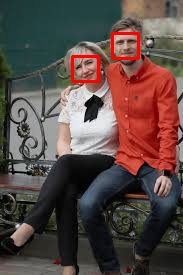

---------------------------------
---------------------------------
-------------images (10).jpg------------
Rostros encontrados en images (10).jpg: 1


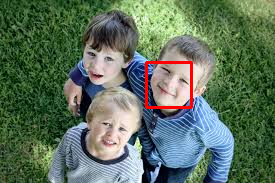

---------------------------------
---------------------------------
-------------download (1).jpg------------
Rostros encontrados en download (1).jpg: 2


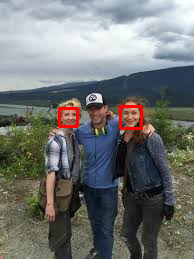

---------------------------------
---------------------------------
-------------images (2).jpg------------
Rostros encontrados en images (2).jpg: 1


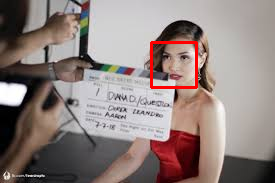

---------------------------------
---------------------------------
-------------images.jpg------------
Rostros encontrados en images.jpg: 1


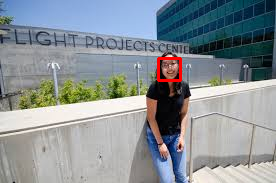

---------------------------------
---------------------------------
-------------images (12).jpg------------
Rostros encontrados en images (12).jpg: 3


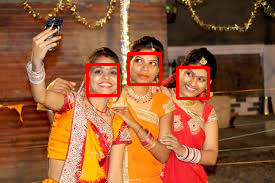

---------------------------------
---------------------------------
-------------images (3).jpg------------
Rostros encontrados en images (3).jpg: 2


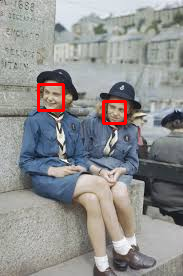

---------------------------------
---------------------------------
-------------images (7).jpg------------
Rostros encontrados en images (7).jpg: 1


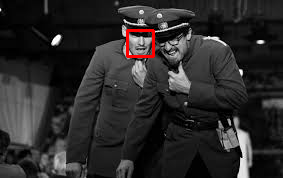

---------------------------------
---------------------------------
-------------images (8).jpg------------
Rostros encontrados en images (8).jpg: 5


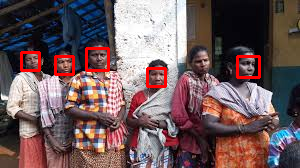

---------------------------------
---------------------------------
-------------images (11).jpg------------
Rostros encontrados en images (11).jpg: 2


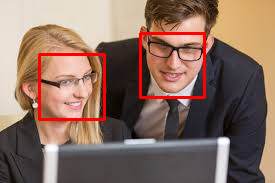

---------------------------------
---------------------------------
-------------images (9).jpg------------
Rostros encontrados en images (9).jpg: 3


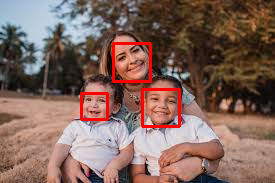

---------------------------------
---------------------------------
-------------images (6).jpg------------
Rostros encontrados en images (6).jpg: 1


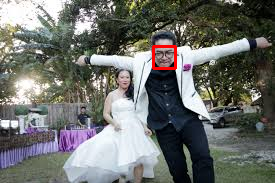

---------------------------------
---------------------------------
-------------image (14).jpg------------
Rostros encontrados en image (14).jpg: 1


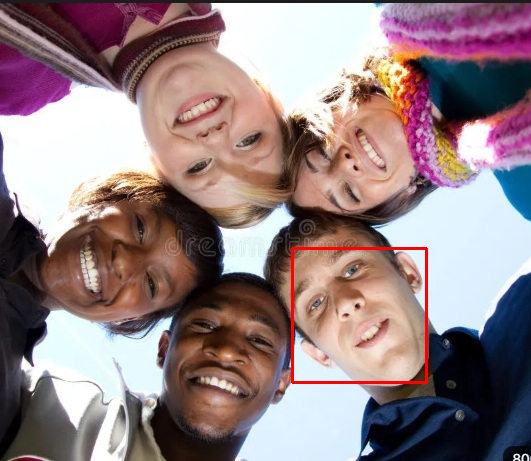

---------------------------------
---------------------------------
-------------image (15).jpg------------
Rostros encontrados en image (15).jpg: 18


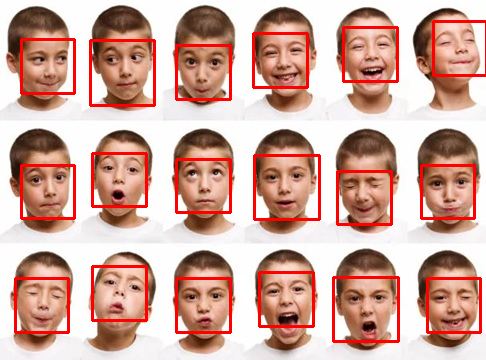

---------------------------------
---------------------------------
-------------images (16).jpg------------
Rostros encontrados en images (16).jpg: 9


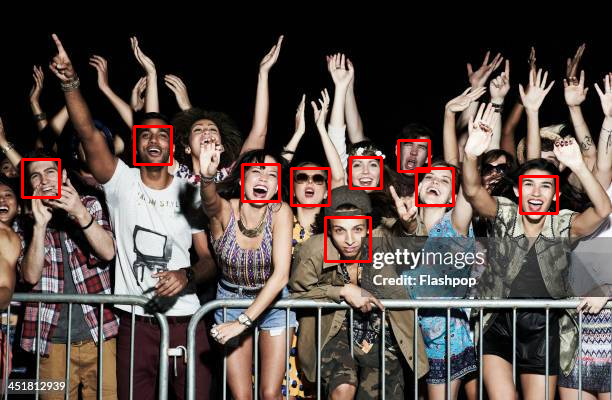

---------------------------------
---------------------------------
-------------images (17).jpg------------
Rostros encontrados en images (17).jpg: 2


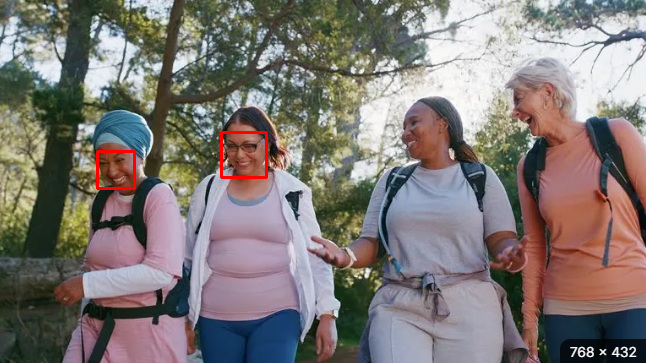

---------------------------------
---------------------------------
Tiempo de ejecucion: 4.4011828899383545 segundos
---------------------------------
---------------------------------
---------------------------------
---------------------------------
Tiempo promedio de ejecucion tras 1 iteraciones: 4.401 segundos


In [ ]:

#--------------------------------------------------------------------------------------------------
# DLIB model

mname = "DLIB"
detector_dlib = dlib.get_frontal_face_detector()

iteraciones = 1
time_window = []
for i in range(iteraciones):
  time_init = time.time()
  counts = 0
  for image in images:
    if not image.lower().endswith(ImageExtensions):
      continue

    img = cv2.imread(f'{faces_path}/{image}')

    if img is None:
      print(f'No se pudo cargar la imágen {image}')
      continue

    ## PREPARACION DE LA IMAGEN.... A ESCALA DE GRISES PARA DLIB
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    ## APLICANDO EL METODO DLIB
    faces = detector_dlib(gray,2)

    print(f'-------------{image}------------')
    print(f'Rostros encontrados en {image}: {len(faces)}')

    ## GRAFICANDO LOS RESULTADOS
    for result in faces:
      x = result.left()
      y = result.top()
      x1 = result.right()
      y1 = result.bottom()
      counts += 1
    ## DIBUJANDO EL RECTANGULO
      cv2.rectangle(img, (x, y), (x1, y1), (0, 0, 255), 2)

    ## MOSTRANDO RESULTADO
    cv2_imshow(img)

    print('---------------------------------')
    print('---------------------------------')
  time_end = time.time()
  print(f'Tiempo de ejecucion: {time_end - time_init} segundos')
  time_window.append(time_end - time_init)
  metrics[mname]["p"] = counts/NFACES * 100
  metrics[mname]["t"] = time_end - time_init
  print('---------------------------------')
  print('---------------------------------')
print('---------------------------------')
print('---------------------------------')
print(f'Tiempo promedio de ejecucion tras {iteraciones} iteraciones: {np.mean(np.array(time_window)):.3f} segundos')



--------------------------------------------
Rostros detectados en images (13).jpg: 1


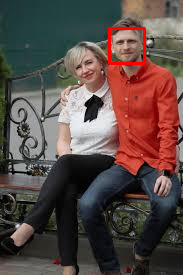

Rostros detectados en images (10).jpg: 1


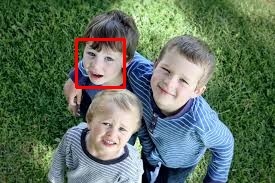

Rostros detectados en download (1).jpg: 1


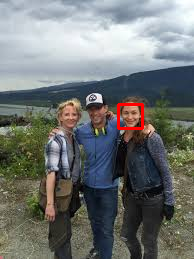

Rostros detectados en images (2).jpg: 1


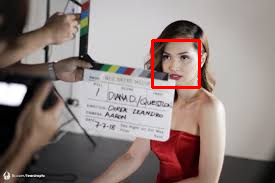

Rostros detectados en images.jpg: 1


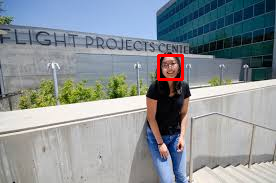

Rostros detectados en images (12).jpg: 2


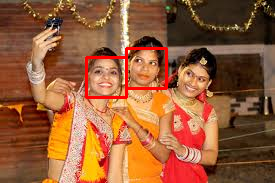

Rostros detectados en images (3).jpg: 2


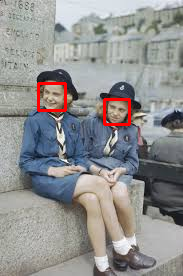

Rostros detectados en images (7).jpg: 1


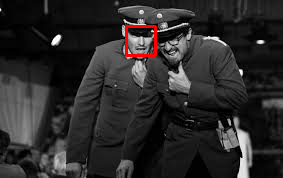

Rostros detectados en images (8).jpg: 5


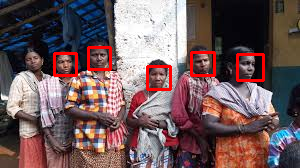

Rostros detectados en images (11).jpg: 3


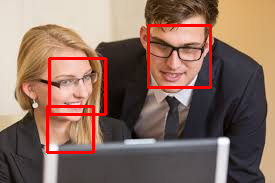

Rostros detectados en images (9).jpg: 2


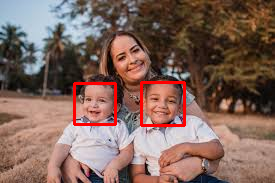

Rostros detectados en images (6).jpg: 1


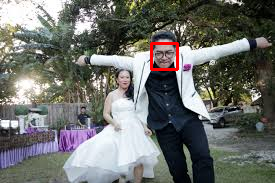

Rostros detectados en image (14).jpg: 0


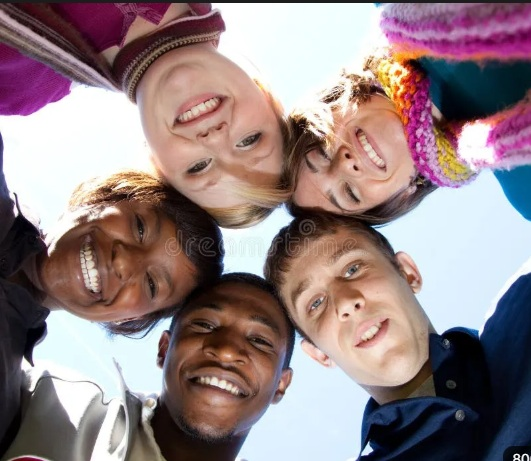

Rostros detectados en image (15).jpg: 18


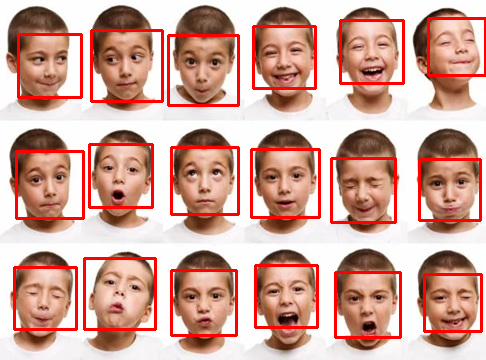

Rostros detectados en images (16).jpg: 8


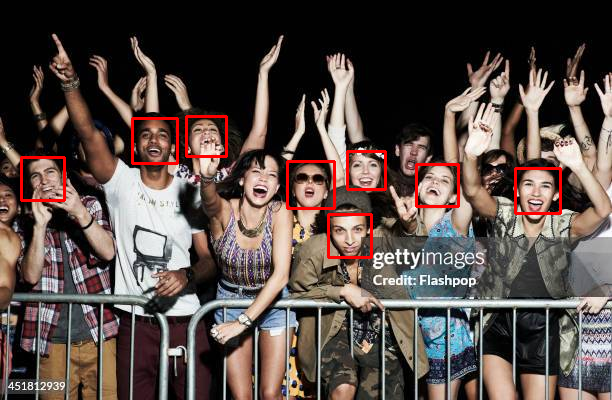

Rostros detectados en images (17).jpg: 1


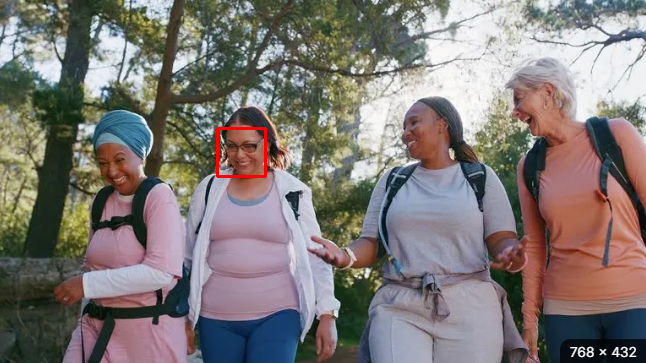

Tiempo de ejecución: 2.786351442337036
--------------------------------------------


In [ ]:

# ----------------------------------------------------------------------------------------------


classifier_haar = cv2.CascadeClassifier('/content/drive/MyDrive/imagenes_faces/face_detection/models/haarcascade_frontalface2.xml')
mname = "HAAR"


iteraciones = 1
time_window = []

for i in range(iteraciones):
  counts = 0
  time_init = time.time()
  print(f'--------------------------------------------')
  for image in images:

    img = cv2.imread(f'{faces_path}/{image}')

    if img is None:
      print(f'No se pudo cargar la imagen: {img}')
      continue
    ## DETECCION DE ROSTROS
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    detection = classifier_haar.detectMultiScale(gray)

    ## PROCESAMOS RESULTADOS
    for result in detection:
      x, y, w, h = result
      x1, y1 = x + w, y + h
      counts += 1
      ## DIBUJAMOS EL RECTANGULO
      cv2.rectangle(img, (x, y), (x1, y1), (0,0,255),2)

    print(f'Rostros detectados en {image}: {len(detection)}')
    cv2_imshow(img)
    cv2.waitKey(0)

  time_end = time.time()
  metrics[mname]["p"] = counts/NFACES * 100
  metrics[mname]["t"] = time_end - time_init

  print(f'Tiempo de ejecución: {time_end - time_init}')
  print(f'--------------------------------------------')
  time_window.append(time_end - time_init)


Lectura de imagen: images (13).jpg exitosa
 Rostros encontrados en images (13).jpg: 2


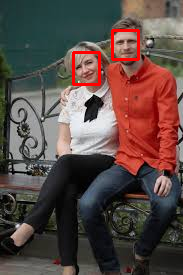

-----------------------------------------
Lectura de imagen: images (10).jpg exitosa
 Rostros encontrados en images (10).jpg: 3


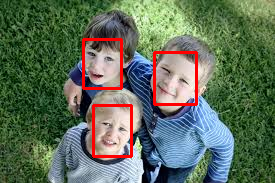

-----------------------------------------
Lectura de imagen: download (1).jpg exitosa
 Rostros encontrados en download (1).jpg: 3


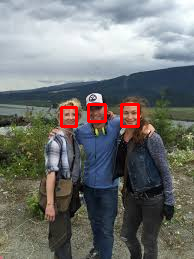

-----------------------------------------
Lectura de imagen: images (2).jpg exitosa
 Rostros encontrados en images (2).jpg: 1


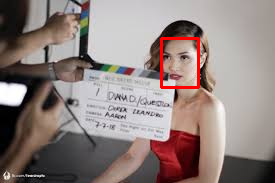

-----------------------------------------
Lectura de imagen: images.jpg exitosa
 Rostros encontrados en images.jpg: 1


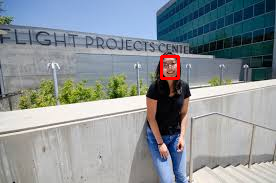

-----------------------------------------
Lectura de imagen: images (12).jpg exitosa
 Rostros encontrados en images (12).jpg: 3


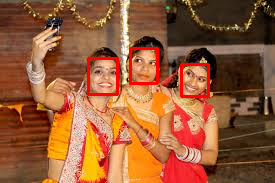

-----------------------------------------
Lectura de imagen: images (3).jpg exitosa
 Rostros encontrados en images (3).jpg: 2


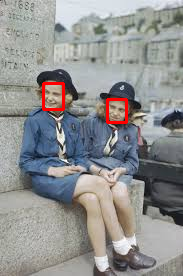

-----------------------------------------
Lectura de imagen: images (7).jpg exitosa
 Rostros encontrados en images (7).jpg: 2


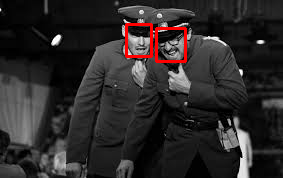

-----------------------------------------
Lectura de imagen: images (8).jpg exitosa
 Rostros encontrados en images (8).jpg: 6


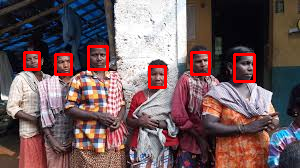

-----------------------------------------
Lectura de imagen: images (11).jpg exitosa
 Rostros encontrados en images (11).jpg: 2


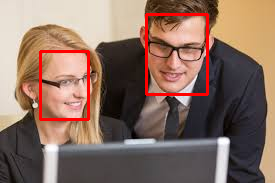

-----------------------------------------
Lectura de imagen: images (9).jpg exitosa
 Rostros encontrados en images (9).jpg: 3


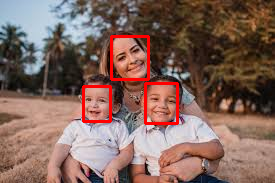

-----------------------------------------
Lectura de imagen: images (6).jpg exitosa
 Rostros encontrados en images (6).jpg: 2


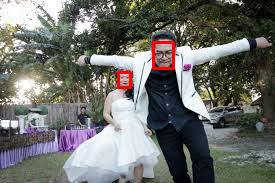

-----------------------------------------
Lectura de imagen: image (14).jpg exitosa
 Rostros encontrados en image (14).jpg: 2


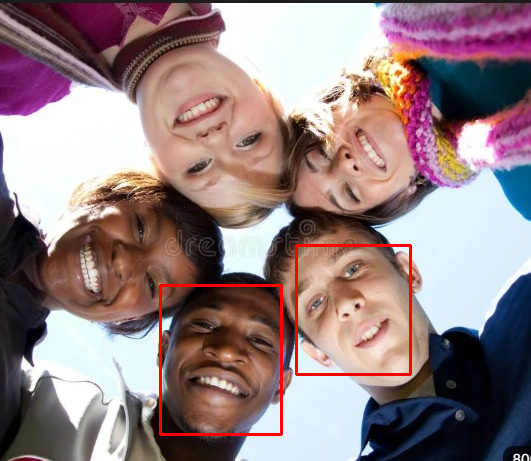

-----------------------------------------
Lectura de imagen: image (15).jpg exitosa
 Rostros encontrados en image (15).jpg: 18


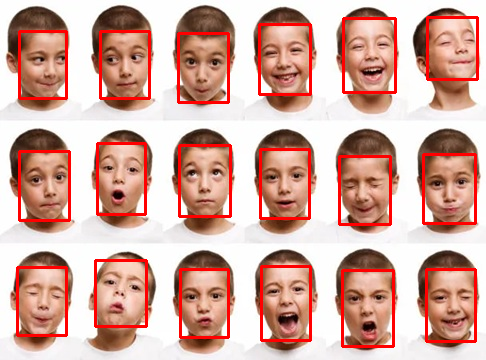

-----------------------------------------
Lectura de imagen: images (16).jpg exitosa
 Rostros encontrados en images (16).jpg: 12


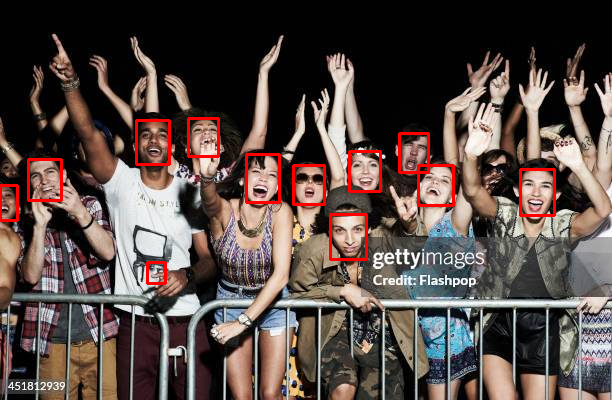

-----------------------------------------
Lectura de imagen: images (17).jpg exitosa
 Rostros encontrados en images (17).jpg: 4


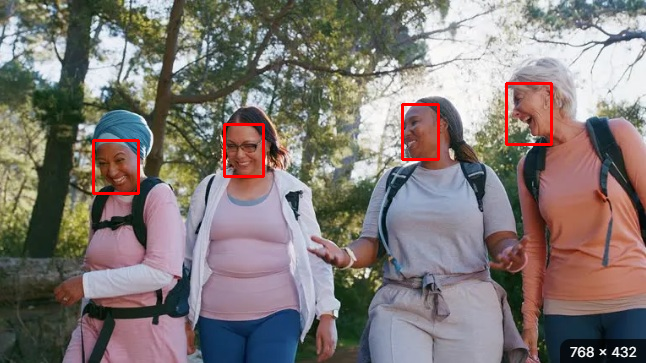

-----------------------------------------
Tiempo de ejecución: 5.61199426651001 segundos
-----------------------------------------


In [ ]:

# --------------------------------------------------------------------------------
detector_mtcnn = MTCNN() ## INICIAMOS EL DETECTOR
mname = "MTCNN"


iteraciones = 1
time_window = []
for i in range(iteraciones):

  time_init = time.time()
  counts = 0
  for image in images:
    img = cv2.imread(f'{faces_path}/{image}')
    print(f'Lectura de imagen: {image} exitosa')

    if img is None:
      print(f'Error al leer la imagen: {image}')
      continue

    ## PREPARACION DE LA IMAGEN PARA ENTRADA A MTCNN
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    ## APLICANDO METODO MTCNN
    faces = detector_mtcnn.detect_faces(img_rgb)

    print(f' Rostros encontrados en {image}: {len(faces)}')

    for result in faces:
      x, y, w, h = result['box']
      x1, y1 = x+w, y+h

      # DIBUJAR UN RECTANGULO SOBRE IMAGEN ORIGINAL
      cv2.rectangle(img, (x, y), (x1, y1), (0, 0, 255), 2)
      counts += 1
    cv2_imshow(img)
    print('-----------------------------------------')

  time_end = time.time()
  print(f'Tiempo de ejecución: {time_end - time_init} segundos')
  time_window.append(time_end - time_init)
  print('-----------------------------------------')
  metrics[mname]["p"] = counts/NFACES * 100
  metrics[mname]["t"] = time_end - time_init


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

## Overall method detection rate

In [ ]:
metricsdf = pd.DataFrame(metrics)

In [ ]:
metricsdf

,HAAR,MTCNN,DLIB,DNN
p,69.565217,95.652174,78.260870,84.057971
t,2.786351,5.611994,4.401183,2.188640


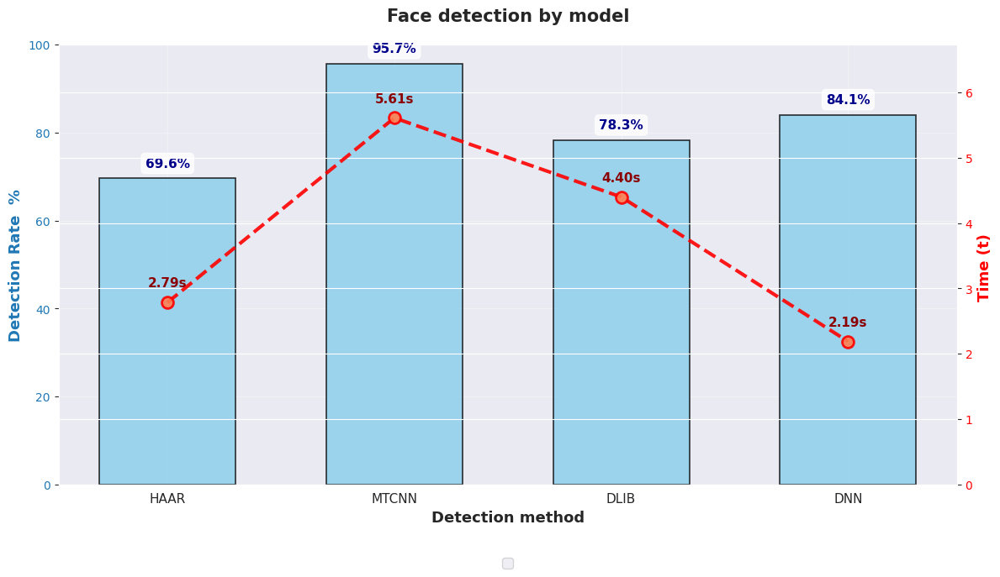

In [ ]:
df = metricsdf

fig, ax1 = plt.subplots(figsize=(12, 7))

x_pos = np.arange(len(df.columns))

bars = ax1.bar(x_pos, df.loc['p'], width=0.6, alpha=0.8,
               color='skyblue',
               edgecolor='black', linewidth=1.2 #, label='p (Precisión)'
               )

ax1.set_xlabel('Detection method', fontsize=13, fontweight='bold')
ax1.set_ylabel('Detection Rate  %', fontsize=13, fontweight='bold', color='#1f77b4')
ax1.tick_params(axis='y', labelcolor='#1f77b4')
ax1.set_xticks(x_pos)
ax1.set_xticklabels(df.columns, fontsize=11)
ax1.set_ylim(0, 100)
ax1.grid(True, alpha=0.3)

ax2 = ax1.twinx()

line = ax2.plot(x_pos, df.loc['t'], marker='o', linewidth=3, markersize=10,
                color='red',
                markerfacecolor='coral', markeredgecolor='red', markeredgewidth=2,
                linestyle='--', alpha=0.9)

ax2.set_ylabel('Time (t) ', fontsize=13, fontweight='bold', color='red')
ax2.tick_params(axis='y', labelcolor='red')
ax2.set_ylim(0, df.loc['t'].max() * 1.2)


plt.title('Face detection by model',
          fontsize=15, fontweight='bold', pad=20)


for i, (bar, value) in enumerate(zip(bars, df.loc['p'])):
    ax1.text(i, value + 2, f'{value:.1f}%',
             ha='center', va='bottom', fontweight='bold',
             color='darkblue', fontsize=11,
             bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8))


for i, value in enumerate(df.loc['t']):
    ax2.text(i, value + 0.2, f'{value:.2f}s',
             ha='center', va='bottom', fontweight='bold',
             color='darkred', fontsize=11,
             #bbox=dict(boxstyle="round,pad=0.3", facecolor="yellow", alpha=0.7)
             )


lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2,
           loc='upper center', bbox_to_anchor=(0.5, -0.15),
           ncol=2, fontsize=12)

plt.tight_layout()
plt.show()


In [ ]:
!ping google.com

/bin/bash: line 1: ping: command not found
